# PC1 vs PC2 vs Time Analysis

This notebook visualizes the temporal evolution of neural activity in the first two principal components (PC1 vs PC2 vs time) for selected trials from the RNN motor control model.


In [1]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.decomposition import PCA
import os
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML


In [2]:
# Load the neural activity data
# Check if pre-computed PCA results exist in the project directory

proj_path = "proj_rnn_eda/"
activity_file = os.path.join(proj_path, "activity.npy")
pca_file = os.path.join(proj_path, "activity_pca.npy")

# Try to load pre-computed PCA results if available
try:
    activity_pca = np.load(pca_file)
    activity = np.load(activity_file)
    print(f"Loaded pre-computed PCA results from {pca_file}")
    print(f"PCA data shape: {activity_pca.shape}")
    print(f"Original activity data shape: {activity.shape}")
    
    # PCA was already performed
    pca_already_done = True
    
except FileNotFoundError:
    print("Pre-computed PCA results not found. Will load raw data and compute PCA.")
    pca_already_done = False
    
    # Try to load the experiment results which should contain the neural activity
    try:
        data = np.load(os.path.join(proj_path, "reaching_relearning_results.npy"), allow_pickle=True).item()
        print("Loaded experiment results")
        
        # Extract activity data from the loaded file
        if 'manifold' in data and 'original' in data['manifold']:
            activity = data['manifold']['original'].get('activity', None)
            if activity is None:
                activity = data['manifold']['original'].get('activity_reshaped', None)
            
            print(f"Activity data shape: {activity.shape}")
        else:
            print("Could not find activity data in the expected structure")
    except FileNotFoundError:
        print("Could not find experiment results file")


Pre-computed PCA results not found. Will load raw data and compute PCA.
Loaded experiment results
Activity data shape: (9000, 800)


PCA computed with 10 components
Explained variance ratio: [0.33262239 0.31384113 0.0483031  0.03736508 0.02920451 0.01947305
 0.01816366 0.01607804 0.01443299 0.01276837]
Cumulative explained variance: [0.33262239 0.64646352 0.69476663 0.73213171 0.76133622 0.78080927
 0.79897293 0.81505097 0.82948395 0.84225232]


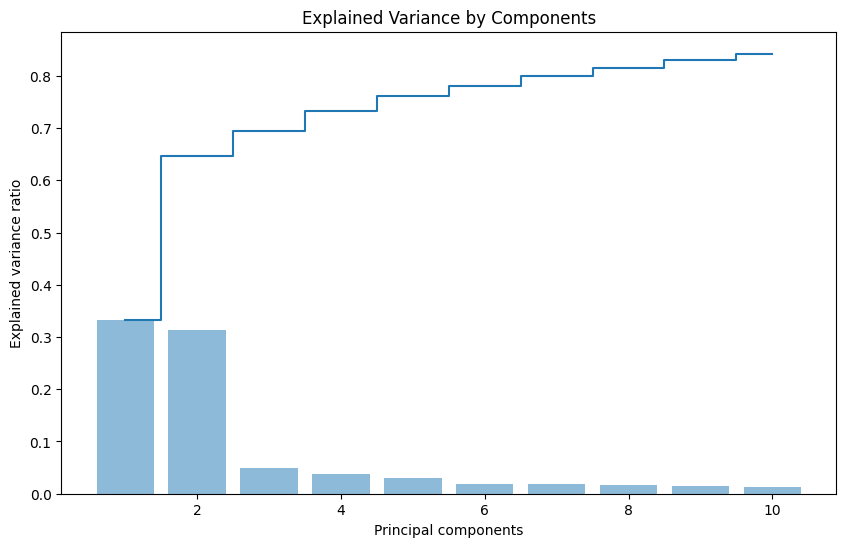

In [3]:
# Perform PCA if not already done
if not pca_already_done and 'activity' in locals() and activity is not None:
    # Compute PCA
    n_components = 10  # Keep more components than we'll visualize
    pca = PCA(n_components=n_components)
    activity_pca = pca.fit_transform(activity)
    
    print(f"PCA computed with {n_components} components")
    print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Cumulative explained variance: {np.cumsum(pca.explained_variance_ratio_)}")
    
    # Plot explained variance
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, n_components + 1), pca.explained_variance_ratio_, alpha=0.5, align='center')
    plt.step(range(1, n_components + 1), np.cumsum(pca.explained_variance_ratio_), where='mid')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.title('Explained Variance by Components')
    plt.show()
else:
    if not pca_already_done:
        print("Cannot perform PCA: activity data not available")


In [4]:
# Reshape PCA data to recover trial structure
# Assuming the data is organized as [trials*timepoints, neurons]
# We need to determine the number of trials and timepoints per trial

# Try to load experiment results to get trial information
try:
    data = np.load(os.path.join(proj_path, "reaching_relearning_results.npy"), allow_pickle=True).item()
    
    # Check if we can find trial information
    if 'manifold' in data and 'original' in data['manifold'] and 'order' in data['manifold']['original']:
        trial_order = data['manifold']['original']['order']
        n_trials = len(trial_order)
        
        # Calculate timepoints per trial
        if 'activity' in data['manifold']['original']:
            total_samples = data['manifold']['original']['activity'].shape[0]
            timepoints_per_trial = total_samples // n_trials
            
            print(f"Found {n_trials} trials with {timepoints_per_trial} timepoints each")
        else:
            # If we can't find the exact structure, make an educated guess
            if 'activity' in locals() and activity is not None:
                total_samples = activity.shape[0]
                # Common values for trials in these experiments
                possible_n_trials = [6, 8, 10, 12]
                
                # Find a value that divides evenly
                for n_tr in possible_n_trials:
                    if total_samples % n_tr == 0:
                        n_trials = n_tr
                        timepoints_per_trial = total_samples // n_trials
                        print(f"Estimated {n_trials} trials with {timepoints_per_trial} timepoints each")
                        break
            else:
                # Default values if we can't determine
                n_trials = 6  # Common value in motor tasks
                timepoints_per_trial = activity_pca.shape[0] // n_trials
                print(f"Using default values: {n_trials} trials with {timepoints_per_trial} timepoints each")
    else:
        # Default values if we can't determine
        n_trials = 6  # Common value in motor tasks
        timepoints_per_trial = activity_pca.shape[0] // n_trials
        print(f"Using default values: {n_trials} trials with {timepoints_per_trial} timepoints each")
        
except FileNotFoundError:
    # If we can't load the file, make an educated guess
    if 'activity_pca' in locals() and activity_pca is not None:
        total_samples = activity_pca.shape[0]
        # Common values for trials in these experiments
        possible_n_trials = [6, 8, 10, 12]
        
        # Find a value that divides evenly
        for n_tr in possible_n_trials:
            if total_samples % n_tr == 0:
                n_trials = n_tr
                timepoints_per_trial = total_samples // n_trials
                print(f"Estimated {n_trials} trials with {timepoints_per_trial} timepoints each")
                break
        else:
            # Default if none divide evenly
            n_trials = 6
            timepoints_per_trial = total_samples // n_trials
            print(f"Using default values: {n_trials} trials with {timepoints_per_trial} timepoints each (not exact)")
    else:
        print("Cannot determine trial structure: PCA data not available")


Found 50 trials with 180 timepoints each


In [5]:
# Reshape PCA data to recover trial structure
if 'activity_pca' in locals() and activity_pca is not None and 'n_trials' in locals() and 'timepoints_per_trial' in locals():
    # Reshape to [n_trials, timepoints_per_trial, n_components]
    pca_by_trial = activity_pca.reshape(n_trials, timepoints_per_trial, -1)
    
    print(f"Reshaped PCA data to: {pca_by_trial.shape}")
    
    # Create a time vector (assuming constant sampling rate)
    # If we know the actual time step, we could use that
    dt = 0.01  # Default time step in seconds
    time = np.arange(0, timepoints_per_trial) * dt
    
    print(f"Time vector created with {len(time)} points, spanning {time[-1]:.2f} seconds")
else:
    print("Cannot reshape data: missing required variables")


Reshaped PCA data to: (50, 180, 10)
Time vector created with 180 points, spanning 1.79 seconds


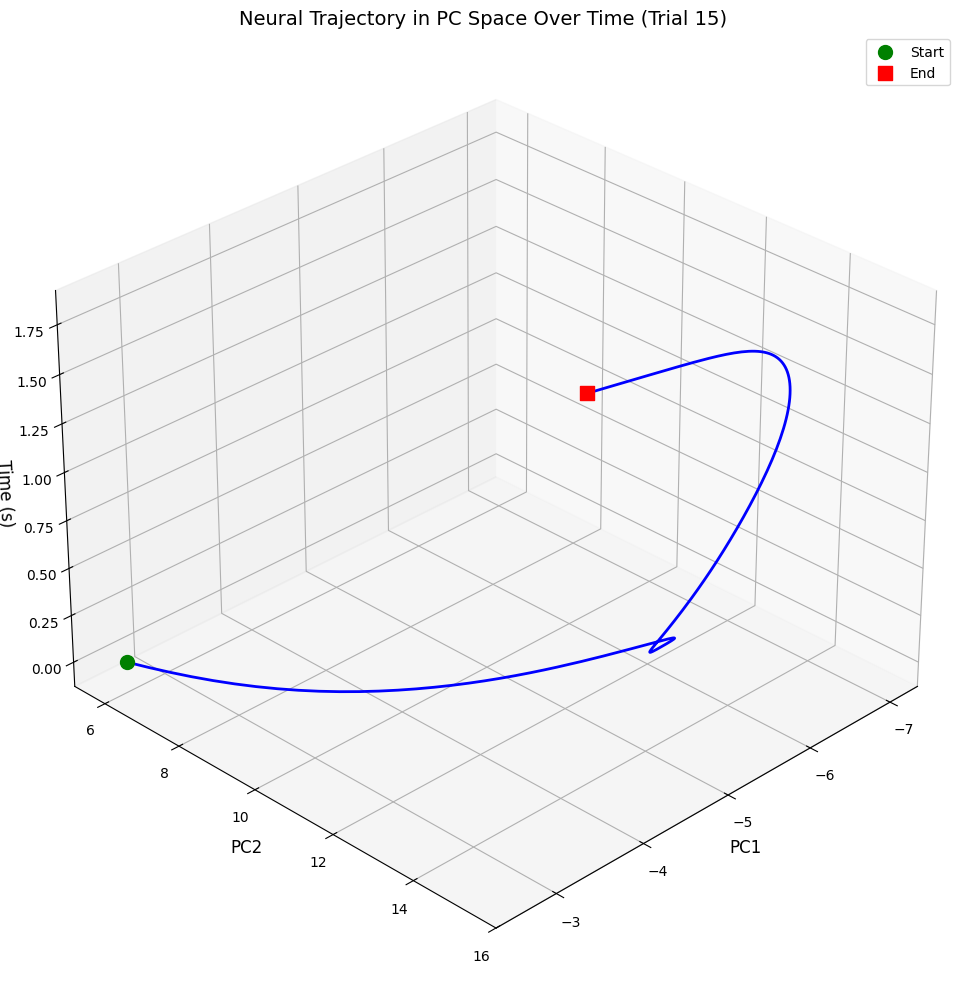

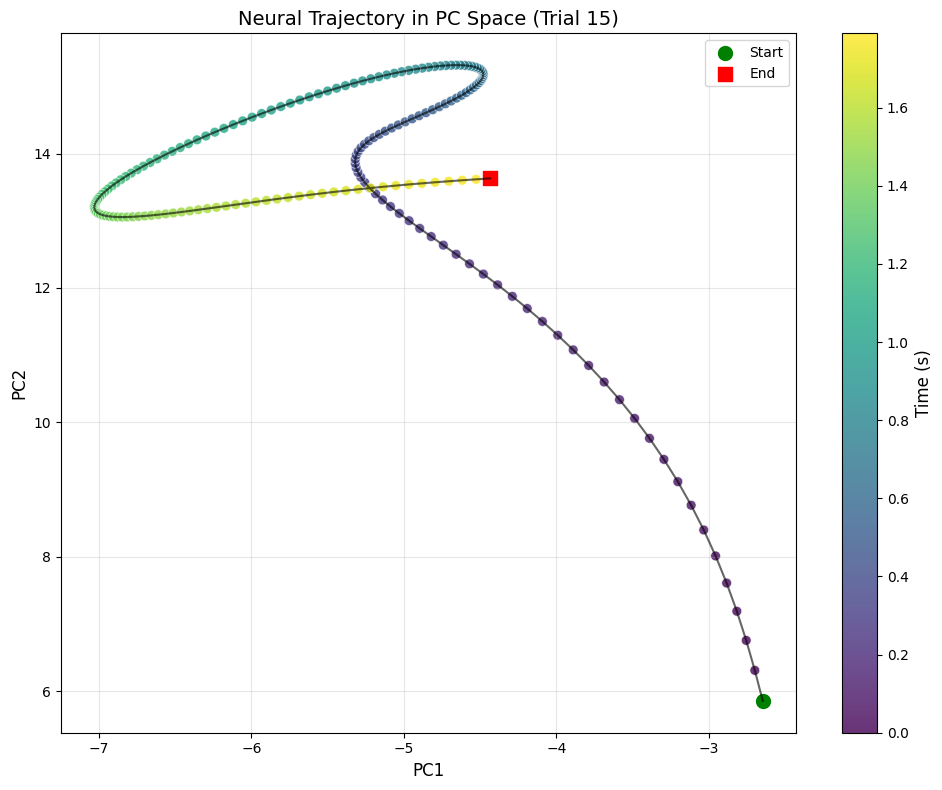

In [11]:
# Visualize PC1 vs PC2 vs Time for trial 15
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Check if trial 15 exists in our data
    if n_trials > 15:
        trial_idx = 15  # Specifically visualize trial 15
        
        # Get PC1, PC2 for this trial
        pc1 = pca_by_trial[trial_idx, :, 0]
        pc2 = pca_by_trial[trial_idx, :, 1]
        
        # Create a 3D plot
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        
        # Plot PC1 vs PC2 vs Time
        ax.plot(pc1, pc2, time, color='blue', linewidth=2)
        
        # Add markers for start and end points
        ax.scatter(pc1[0], pc2[0], time[0], color='green', marker='o', s=100, label='Start')
        ax.scatter(pc1[-1], pc2[-1], time[-1], color='red', marker='s', s=100, label='End')
        
        # Set labels and title
        ax.set_xlabel('PC1', fontsize=12)
        ax.set_ylabel('PC2', fontsize=12)
        ax.set_zlabel('Time (s)', fontsize=12)
        ax.set_title(f'Neural Trajectory in PC Space Over Time (Trial {trial_idx})', fontsize=14)
        
        # Add legend
        ax.legend(fontsize=10)
        
        # Adjust view angle for better visualization
        ax.view_init(elev=30, azim=45)
        
        plt.tight_layout()
        plt.show()
        
        # Also create a 2D plot of PC1 vs PC2 colored by time for the same trial
        fig, ax = plt.subplots(figsize=(10, 8))
        
        # Create a scatter plot colored by time
        scatter = ax.scatter(pc1, pc2, c=time, cmap='viridis', 
                            s=50, alpha=0.8, edgecolors='w', linewidths=0.5)
        
        # Add a colorbar
        cbar = plt.colorbar(scatter)
        cbar.set_label('Time (s)', fontsize=12)
        
        # Plot the trajectory
        ax.plot(pc1, pc2, 'k-', alpha=0.6, linewidth=1.5)
        
        # Mark start and end points
        ax.scatter(pc1[0], pc2[0], color='green', s=100, marker='o', label='Start')
        ax.scatter(pc1[-1], pc2[-1], color='red', s=100, marker='s', label='End')
        
        # Set labels and title
        ax.set_xlabel('PC1', fontsize=12)
        ax.set_ylabel('PC2', fontsize=12)
        ax.set_title(f'Neural Trajectory in PC Space (Trial {trial_idx})', fontsize=14)
        
        # Add legend
        ax.legend(fontsize=10)
        
        # Add grid
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"Trial 15 does not exist. The dataset contains {n_trials} trials (0 to {n_trials-1}).")
else:
    print("Cannot create visualization: PCA data by trial not available")


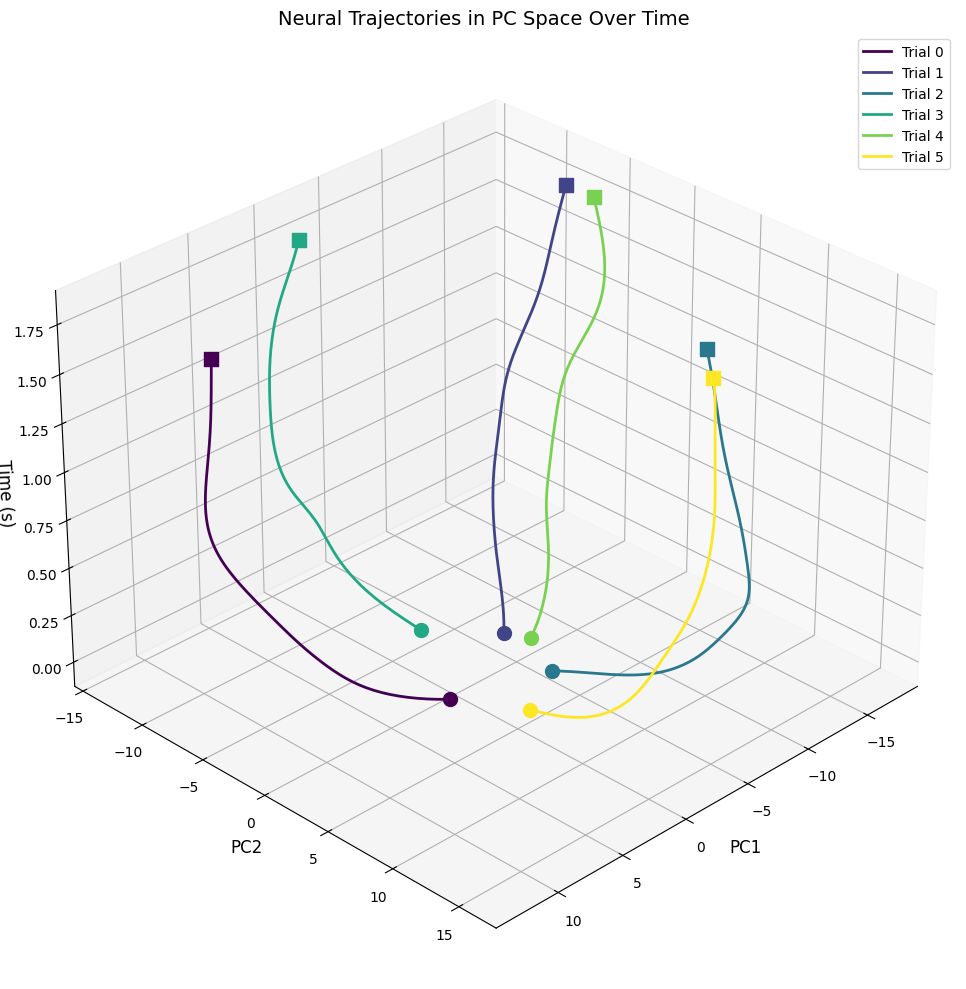

In [6]:
# Visualize PC1 vs PC2 vs Time for selected trials
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Select trials to visualize (can be adjusted)
    selected_trials = range(min(n_trials, 6))  # Visualize up to 6 trials
    
    # Create a 3D plot
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Color map for different trials
    colors = plt.cm.viridis(np.linspace(0, 1, len(selected_trials)))
    
    for i, trial_idx in enumerate(selected_trials):
        # Get PC1, PC2 for this trial
        pc1 = pca_by_trial[trial_idx, :, 0]
        pc2 = pca_by_trial[trial_idx, :, 1]
        
        # Plot PC1 vs PC2 vs Time
        ax.plot(pc1, pc2, time, color=colors[i], label=f'Trial {trial_idx}', linewidth=2)
        
        # Add markers for start and end points
        ax.scatter(pc1[0], pc2[0], time[0], color=colors[i], marker='o', s=100, label='_nolegend_')
        ax.scatter(pc1[-1], pc2[-1], time[-1], color=colors[i], marker='s', s=100, label='_nolegend_')
    
    # Set labels and title
    ax.set_xlabel('PC1', fontsize=12)
    ax.set_ylabel('PC2', fontsize=12)
    ax.set_zlabel('Time (s)', fontsize=12)
    ax.set_title('Neural Trajectories in PC Space Over Time', fontsize=14)
    
    # Add legend
    ax.legend(fontsize=10)
    
    # Adjust view angle for better visualization
    ax.view_init(elev=30, azim=45)
    
    plt.tight_layout()
    plt.show()
else:
    print("Cannot create visualization: PCA data by trial not available")


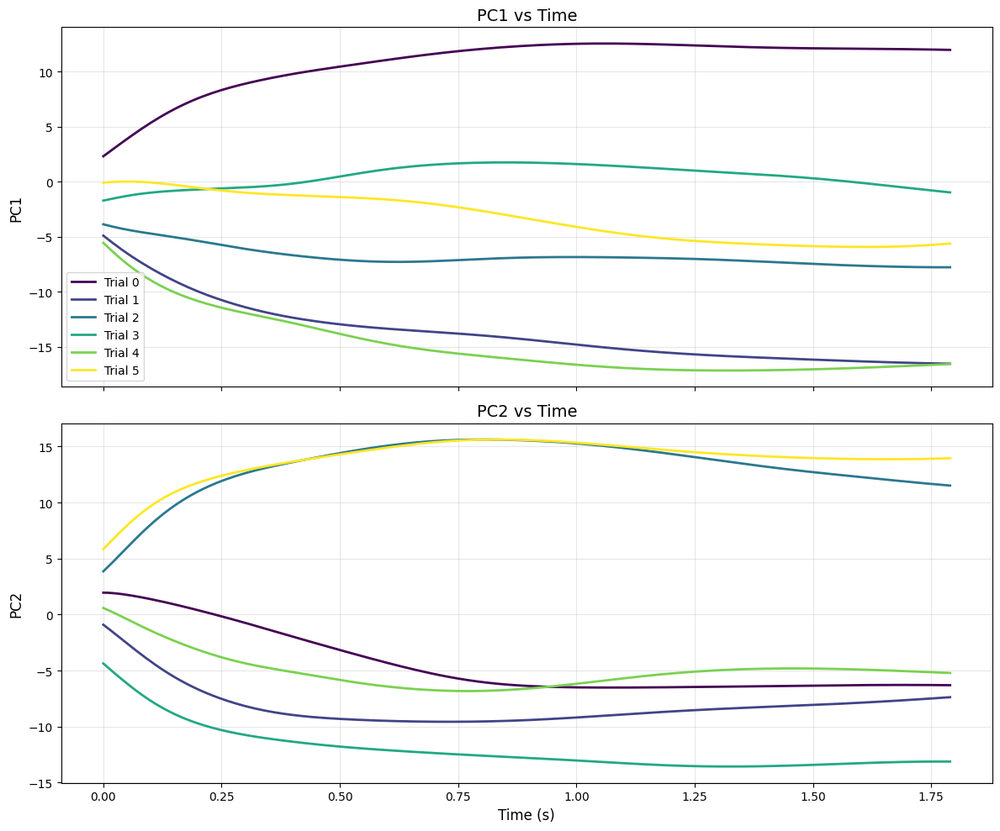

In [7]:
# Create 2D plots of PC1 vs Time and PC2 vs Time
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Select trials to visualize (can be adjusted)
    selected_trials = range(min(n_trials, 6))  # Visualize up to 6 trials
    
    # Create subplots
    fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    
    # Color map for different trials
    colors = plt.cm.viridis(np.linspace(0, 1, len(selected_trials)))
    
    # Plot PC1 vs Time
    for i, trial_idx in enumerate(selected_trials):
        pc1 = pca_by_trial[trial_idx, :, 0]
        axes[0].plot(time, pc1, color=colors[i], label=f'Trial {trial_idx}', linewidth=2)
        
    axes[0].set_ylabel('PC1', fontsize=12)
    axes[0].set_title('PC1 vs Time', fontsize=14)
    axes[0].grid(True, alpha=0.3)
    axes[0].legend(fontsize=10)
    
    # Plot PC2 vs Time
    for i, trial_idx in enumerate(selected_trials):
        pc2 = pca_by_trial[trial_idx, :, 1]
        axes[1].plot(time, pc2, color=colors[i], label=f'Trial {trial_idx}', linewidth=2)
        
    axes[1].set_xlabel('Time (s)', fontsize=12)
    axes[1].set_ylabel('PC2', fontsize=12)
    axes[1].set_title('PC2 vs Time', fontsize=14)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("Cannot create visualization: PCA data by trial not available")


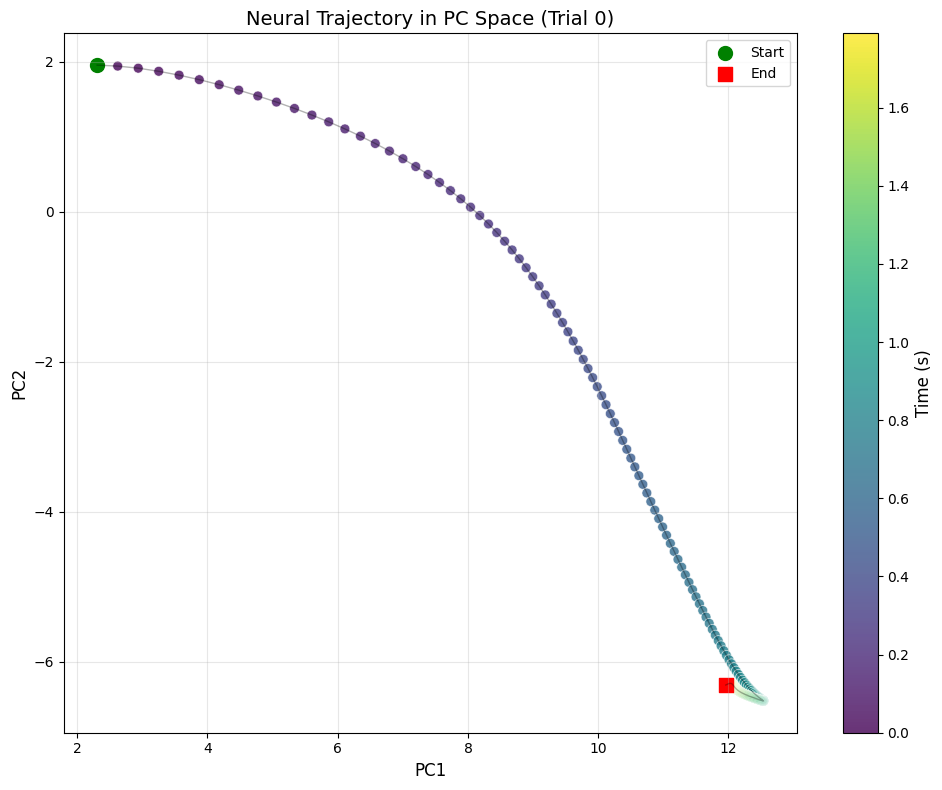

In [9]:
# Create an animated plot of PC1 vs PC2 colored by time
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Select a trial to visualize
    trial_idx = 0  # Can be changed to visualize different trials
    
    # Get PC1, PC2 for this trial
    pc1 = pca_by_trial[trial_idx, :, 0]
    pc2 = pca_by_trial[trial_idx, :, 1]
    
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create a scatter plot colored by time
    scatter = ax.scatter(pc1, pc2, c=time, cmap='viridis', 
                         s=50, alpha=0.8, edgecolors='w', linewidths=0.5)
    
    # Add a colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Time (s)', fontsize=12)
    
    # Plot the trajectory
    ax.plot(pc1, pc2, 'k-', alpha=0.3, linewidth=1)
    
    # Mark start and end points
    ax.scatter(pc1[0], pc2[0], color='green', s=100, marker='o', label='Start')
    ax.scatter(pc1[-1], pc2[-1], color='red', s=100, marker='s', label='End')
    
    # Set labels and title
    ax.set_xlabel('PC1', fontsize=12)
    ax.set_ylabel('PC2', fontsize=12)
    ax.set_title(f'Neural Trajectory in PC Space (Trial {trial_idx})', fontsize=14)
    
    # Add legend
    ax.legend(fontsize=10)
    
    # Add grid
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Create an animation function
    def create_animation(trial_idx=0):
        # Get PC1, PC2 for this trial
        pc1 = pca_by_trial[trial_idx, :, 0]
        pc2 = pca_by_trial[trial_idx, :, 1]
        
        fig, ax = plt.subplots(figsize=(10, 8))
        
        # Plot full trajectory as reference (faint)
        ax.plot(pc1, pc2, 'k-', alpha=0.2)
        
        # Initialize point
        point, = ax.plot([], [], 'ro', markersize=10)
        
        # Initialize trail
        trail, = ax.plot([], [], 'r-', linewidth=2, alpha=0.7)
        
        # Set axis limits
        ax.set_xlim(pc1.min() - 0.1 * abs(pc1.min()), 
                    pc1.max() + 0.1 * abs(pc1.max()))
        ax.set_ylim(pc2.min() - 0.1 * abs(pc2.min()), 
                    pc2.max() + 0.1 * abs(pc2.max()))
        
        # Set labels
        ax.set_xlabel('PC1', fontsize=12)
        ax.set_ylabel('PC2', fontsize=12)
        ax.set_title(f'Neural Trajectory in PC Space (Trial {trial_idx})', fontsize=14)
        
        # Add grid
        ax.grid(True, alpha=0.3)
        
        # Time text
        time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=12)
        
        # Animation function
        def animate(i):
            # Update point position
            point.set_data([pc1[i]], [pc2[i]])
            
            # Update trail
            trail.set_data(pc1[:i+1], pc2[:i+1])
            
            # Update time text
            time_text.set_text(f'Time: {time[i]:.2f}s')
            
            return point, trail, time_text
        
        # Create animation
        anim = FuncAnimation(fig, animate, frames=range(len(time)), interval=50, blit=True)
        
        plt.close()  # Prevent display of the static figure
        return anim
    
    # Create and display animation for the first trial
    anim = create_animation(trial_idx=0)
    
    # Display the animation in the notebook
    display(HTML(anim.to_jshtml()))
else:
    print("Cannot create visualization: PCA data by trial not available")


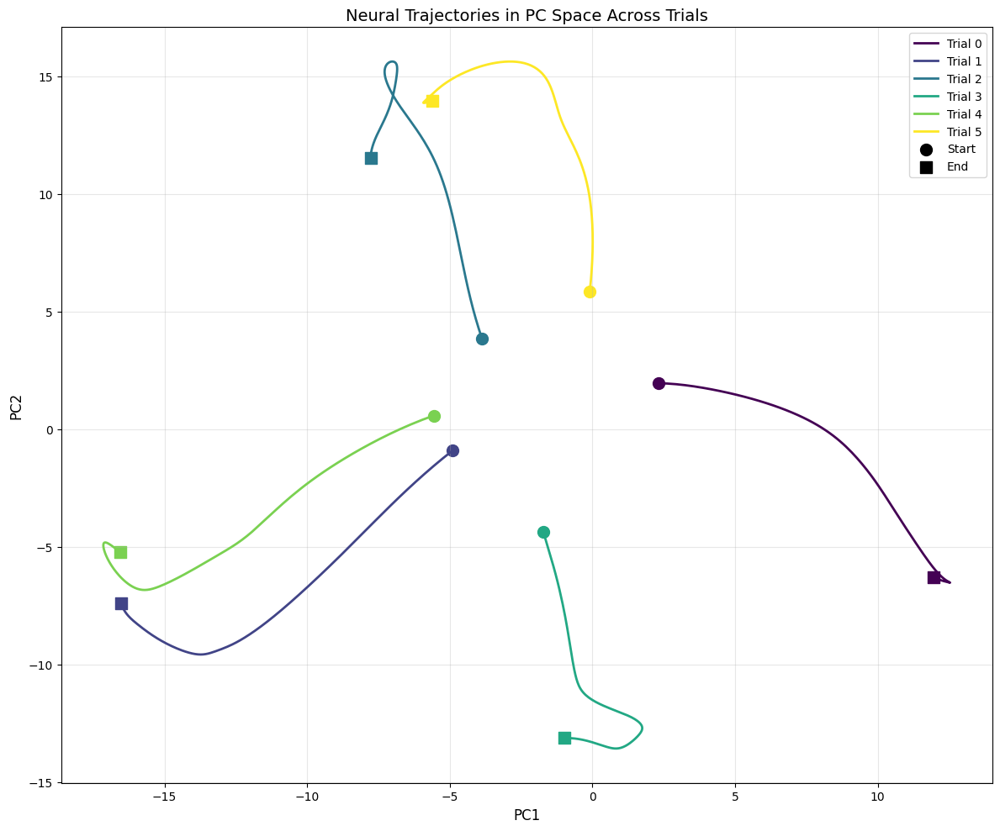

In [10]:
# Compare multiple trials in a single plot
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Select trials to visualize
    selected_trials = range(min(n_trials, 6))  # Visualize up to 6 trials
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Color map for different trials
    colors = plt.cm.viridis(np.linspace(0, 1, len(selected_trials)))
    
    # Plot each trial
    for i, trial_idx in enumerate(selected_trials):
        # Get PC1, PC2 for this trial
        pc1 = pca_by_trial[trial_idx, :, 0]
        pc2 = pca_by_trial[trial_idx, :, 1]
        
        # Plot the trajectory
        ax.plot(pc1, pc2, color=colors[i], linewidth=2, label=f'Trial {trial_idx}')
        
        # Mark start and end points
        ax.scatter(pc1[0], pc2[0], color=colors[i], s=100, marker='o')
        ax.scatter(pc1[-1], pc2[-1], color=colors[i], s=100, marker='s')
    
    # Add start/end markers to legend
    ax.scatter([], [], color='k', s=100, marker='o', label='Start')
    ax.scatter([], [], color='k', s=100, marker='s', label='End')
    
    # Set labels and title
    ax.set_xlabel('PC1', fontsize=12)
    ax.set_ylabel('PC2', fontsize=12)
    ax.set_title('Neural Trajectories in PC Space Across Trials', fontsize=14)
    
    # Add legend
    ax.legend(fontsize=10)
    
    # Add grid
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("Cannot create visualization: PCA data by trial not available")


In [12]:
# Save the processed data for future use
if 'pca_by_trial' in locals() and pca_by_trial is not None:
    # Create a directory to save results if it doesn't exist
    results_dir = "pc_analysis_results"
    if not os.path.exists(results_dir):
        os.makedirs(results_dir)
    
    # Save the reshaped PCA data
    np.save(os.path.join(results_dir, "pca_by_trial.npy"), pca_by_trial)
    
    # Save the time vector
    np.save(os.path.join(results_dir, "time_vector.npy"), time)
    
    print(f"Saved processed data to {results_dir}/")
else:
    print("No data to save")


Saved processed data to pc_analysis_results/
